### 5번 이상 상호작용한 user, 5번 이상 등장한 item

In [1]:
import pandas as pd
df= pd.read_csv('data/e_commerce_cosmetic/e_commerce_cosmetic.csv')
df = df[['user_id', 'product_id', 'brand', 'category_id', 'event_time']]
# df['timestamp']= pd.to_datetime(df['event_time']).astype(int) // 10**9

item_counts = df['product_id'].value_counts()
selected_items = item_counts[item_counts >= 5].index.tolist()
df=df[df['product_id'].isin(selected_items)]

gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()
gropuby_df['list_length'] = gropuby_df['product_id'].apply(len)
selected_users = gropuby_df[gropuby_df['list_length'] >= 5]['user_id'].tolist()

df = df[df['user_id'].isin(selected_users)]

print(df)

# df_extracted = df.iloc[:1000]
# df_extracted

            user_id  product_id     brand          category_id  \
0         595412617     5798924    zinger  1783999068867920626   
1         420652863     5793052       NaN  1487580005754995573   
2         595412617     5837111   staleks  1783999068867920626   
3         593016733     5850281  marathon  1487580006300255120   
4         595411904     5802440       NaN  2151191070908613477   
...             ...         ...       ...                  ...   
17494160  429913900     5848062       NaN  1526733091857498510   
17494161  433392631     5769981       cnd  1487580005411062629   
17494162  429913900     5848062       NaN  1526733091857498510   
17494163  556138645     5885631       NaN  1783999064103190764   
17494164  429913900     5870838      milv  1487580007675986893   

                       event_time  
0         2020-01-01 00:00:19 UTC  
1         2020-01-01 00:00:24 UTC  
2         2020-01-01 00:00:30 UTC  
3         2020-01-01 00:00:37 UTC  
4         2020-01-01 00:00:

In [2]:
df.drop_duplicates(subset=['user_id', 'product_id','event_time']) # 중복 제거된 행 없음->중복 x 확인

,user_id,product_id,brand,category_id,event_time
0,595412617,5798924,zinger,1783999068867920626,2020-01-01 00:00:19 UTC
1,420652863,5793052,NaN,1487580005754995573,2020-01-01 00:00:24 UTC
2,595412617,5837111,staleks,1783999068867920626,2020-01-01 00:00:30 UTC
3,593016733,5850281,marathon,1487580006300255120,2020-01-01 00:00:37 UTC
4,595411904,5802440,NaN,2151191070908613477,2020-01-01 00:00:46 UTC
...,...,...,...,...,...
17494160,429913900,5848062,NaN,1526733091857498510,2019-10-31 23:59:13 UTC
17494161,433392631,5769981,cnd,1487580005411062629,2019-10-31 23:59:14 UTC
17494162,429913900,5848062,NaN,1526733091857498510,2019-10-31 23:59:25 UTC
17494163,556138645,5885631,NaN,1783999064103190764,2019-10-31 23:59:30 UTC


In [28]:
gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()

def extract_duplicates(items):
    duplicate_items = []
    for item in items:
        if items.count(item) > 1 and item not in duplicate_items:
            duplicate_items.append(item)
    return duplicate_items

# 새로운 컬럼에 중복된 항목 저장
gropuby_df['duplicated_items'] = gropuby_df['product_id'].apply(extract_duplicates)

from collections import Counter
# 각 행의 아이템 등장 횟수를 세는 함수 정의
def count_max_occurrence(row):
    counts = Counter(row)
    if counts:
        return max(counts.values())  # 가장 많이 등장한 아이템의 등장 횟수 반환
    else:
        return 0  # 빈 리스트인 경우 등장 횟수는 0

gropuby_df['max_occurrence'] = gropuby_df['product_id'].apply(count_max_occurrence)# user별 최대로 아이템을 반복 구매한 횟수
gropuby_df
print(gropuby_df)

          user_id                                         product_id  \
0         1458813  [5711145, 5814066, 5800358, 5800349, 5800349, ...   
1         2963072  [5746011, 5707747, 5746011, 5707747, 5841190, ...   
2         4103071  [5815653, 5784982, 5795273, 5670334, 5735272, ...   
3         4661182  [5809910, 5816169, 5809912, 5809910, 5809911, ...   
4         5493470  [5745712, 5745712, 49674, 49674, 5587748, 4590...   
...           ...                                                ...   
394278  622082232  [5822300, 5822297, 5549770, 5560966, 5567900, ...   
394279  622082947  [5815662, 5815662, 5815662, 5773161, 5793704, ...   
394280  622083330  [5883087, 5883087, 5883088, 5896787, 5896786, ...   
394281  622084975  [5750301, 5662699, 5838938, 5885848, 5862943, ...   
394282  622086433      [5866471, 5769368, 5922857, 5844342, 5661522]   

                                         duplicated_items  max_occurrence  
0       [5814066, 5800358, 5800349, 5712576, 5711087, ...  

In [34]:
118578/394283*100

30.074337468265178

In [38]:
df[df['user_id'].isin(selected_users)]

,user_id,product_id,brand,category_id,event_time
0,595412617,5798924,zinger,1783999068867920626,2020-01-01 00:00:19 UTC
2,595412617,5837111,staleks,1783999068867920626,2020-01-01 00:00:30 UTC
9,539775844,5911252,dartnails,1487580007675986893,2020-01-01 00:01:31 UTC
11,595412617,5831649,NaN,1783999068867920626,2020-01-01 00:01:33 UTC
21,572002047,5703723,zinger,1487580013489291461,2020-01-01 00:02:37 UTC
...,...,...,...,...,...
17493788,552189464,5732789,igrobeauty,1487580013011140782,2019-10-31 23:34:16 UTC
17493873,566273978,5741342,irisk,1487580005427839846,2019-10-31 23:38:36 UTC
17493910,566273978,5741278,irisk,1487580005427839846,2019-10-31 23:39:49 UTC
17494118,360585367,5869135,cosmoprofi,1783999064136745198,2019-10-31 23:55:57 UTC


In [32]:
selected_users=gropuby_df[gropuby_df['max_occurrence']<=2]['user_id']
# 원래는 df에서 제외해야함
gropuby_df=gropuby_df[gropuby_df['user_id'].isin(selected_users)]
gropuby_df

,user_id,product_id,duplicated_items,max_occurrence,ratio_product_length_max_repurchase
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ...","[5814066, 5800358, 5800349, 5712576, 5711087, ...",2,6.451613
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",[5784982],2,25.000000
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590...","[5745712, 49674, 4590]",2,20.000000
11,13117447,"[5866215, 5899429, 5899431, 5899426, 5899427, ...",[5899429],2,28.571429
17,16460232,"[5787037, 5786837, 5798928, 5798929, 5786834, ...","[5787037, 5798925]",2,10.526316
...,...,...,...,...,...
394273,622076033,"[5647150, 5649235, 5651725, 5650138, 5650702, ...",[5647150],2,13.333333
394275,622077265,"[5833318, 5833318, 5848411, 5870843, 5819126, ...",[5833318],2,28.571429
394277,622080148,"[5651977, 5728072, 5651977, 36237, 5905553, 50...","[5651977, 5905553]",2,25.000000
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ...","[5862943, 5862936, 5929030, 5826197, 5787015]",2,11.764706


In [11]:
(gropuby_df[gropuby_df['max_occurrence']<=2]['max_occurrence']==2).sum()

83793

In [12]:
34785+83793

118578

In [13]:
83793/118578  #반복해서 아이템을 한 개 이상 구매한 user 비율

0.7066487881394525

In [26]:
gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()

In [33]:
gropuby_df['ratio_product_length_max_repurchase']=gropuby_df['max_occurrence']/gropuby_df['product_id'].apply(lambda x:len(x))*100
# gropuby_df=gropuby_df[gropuby_df['ratio_product_length_max_repurchase']<30]
gropuby_df

,user_id,product_id,duplicated_items,max_occurrence,ratio_product_length_max_repurchase
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ...","[5814066, 5800358, 5800349, 5712576, 5711087, ...",2,6.451613
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",[5784982],2,25.000000
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590...","[5745712, 49674, 4590]",2,20.000000
11,13117447,"[5866215, 5899429, 5899431, 5899426, 5899427, ...",[5899429],2,28.571429
17,16460232,"[5787037, 5786837, 5798928, 5798929, 5786834, ...","[5787037, 5798925]",2,10.526316
...,...,...,...,...,...
394273,622076033,"[5647150, 5649235, 5651725, 5650138, 5650702, ...",[5647150],2,13.333333
394275,622077265,"[5833318, 5833318, 5848411, 5870843, 5819126, ...",[5833318],2,28.571429
394277,622080148,"[5651977, 5728072, 5651977, 36237, 5905553, 50...","[5651977, 5905553]",2,25.000000
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ...","[5862943, 5862936, 5929030, 5826197, 5787015]",2,11.764706


In [24]:
# explode() 함수를 사용하여 리스트 풀기
groupby_df_exploded = gropuby_df.explode('product_id')

# 고유한 원소 추출
unique_elements = groupby_df_exploded['product_id'].unique().tolist()

print(unique_elements)
len(unique_elements)  #47379

[5711145, 5814066, 5800358, 5800349, 5712576, 5905673, 5727766, 5905674, 5711087, 5711732, 5711135, 5711078, 5711700, 5711117, 5711160, 5711172, 5711720, 5711710, 5711721, 5711154, 5711122, 5902955, 5900256, 5542414, 5838771, 5746011, 5707747, 5841190, 5896414, 5774240, 5656122, 5700025, 5875320, 5677604, 5875321, 5875318, 5898229, 5815653, 5784982, 5795273, 5670334, 5735272, 5563536, 5858353, 5809910, 5816169, 5809912, 5809911, 5805749, 5778934, 4185, 5667096, 5816172, 5816173, 5854820, 5854822, 5816175, 5816168, 5745712, 49674, 5587748, 4590, 5815680, 34763, 31589, 5882900, 5745715, 5739470, 5739036, 5739038, 5823668, 5823669, 5739030, 5739057, 5812138, 5884282, 5840388, 5709126, 5854567, 5861411, 5881923, 5746635, 5810176, 5857896, 5827351, 5875372, 5875774, 5783523, 5696858, 5810719, 5889616, 5802678, 5785589, 5866964, 5896421, 5896422, 5755446, 5866959, 5769287, 5896417, 5729779, 5746847, 5729778, 5724621, 5724681, 5724282, 5811668, 5724608, 5724658, 5847854, 5896605, 5896606, 570

47379

In [25]:
# explode() 함수를 사용하여 리스트 풀기
groupby_df_exploded = gropuby_df.explode('duplicated_items')

# 고유한 원소 추출
unique_duplicated_elements = groupby_df_exploded['duplicated_items'].unique().tolist()

print(unique_duplicated_elements)
len(unique_duplicated_elements)  # 46775  ->중복돼서 구매된 

[5814066, 5800358, 5800349, 5712576, 5711087, 5711720, 5746011, 5707747, 5896414, 5774240, 5875320, 5677604, 5875318, 5784982, 5809910, 5809912, 5809911, 4185, 5745712, 49674, 4590, 5882900, 5739470, 5739036, 5739038, 5823668, 5823669, 5739057, 5812138, 5709126, 5827351, 5875372, 5783523, 5810719, 5866964, 5896421, 5896422, 5769287, 5724621, 5724681, 5724282, 5811668, 5724608, 5724658, 5896605, 5896606, 5705033, 5811704, 5811695, 5812238, 5812220, 5811688, 5812039, 5812033, 5812052, 5811662, 5811667, 5812042, 5724305, 5835924, 5807862, 5855332, 5773361, 5724670, 5896429, 5841190, 5896419, 5844670, 5824819, 5875289, 5867603, 5838628, 5838622, 5904753, 5659842, 5904741, 5904740, 5904693, 5904310, 5903966, 5903953, 5907066, 5914455, 5883100, 5838940, 5877190, 5908214, 5862290, 5903991, 5862289, 5903728, 5904369, 5908265, 5908243, 5901653, 5900609, 5900626, 5900653, 5900575, 5875296, 5914286, 5875293, 5875295, 5833673, 5833651, 5838002, 5813494, 5878917, 5863562, 5928191, 5928190, 5928189,

46775

In [37]:
46775/47379*100

98.7251736001182

In [175]:
gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()
gropuby_df

,user_id,product_id
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ..."
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ..."
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ..."
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ..."
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590..."
...,...,...
394278,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ..."
394279,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ..."
394280,622083330,"[5883087, 5883087, 5883088, 5896787, 5896786, ..."
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ..."


In [157]:
ratio_selected_users=gropuby_df[gropuby_df['ratio_product_length_max_repurchase']<30]['user_id']
df=df[df['user_id'].isin(ratio_selected_users)]
gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()
gropuby_df

,user_id,product_id
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ..."
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ..."
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ..."
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ..."
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590..."
...,...,...
251264,622080148,"[5651977, 5728072, 5651977, 36237, 5905553, 50..."
251265,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ..."
251266,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ..."
251267,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ..."


In [4]:
import pandas as pd

gropuby_df['user_id'],_=pd.factorize(gropuby_df['user_id'])

In [22]:
gropuby_df[gropuby_df['user_id']==23]

,user_id,product_id,duplicated_items
23,23,"[5835106, 5835366, 5835107, 5835107, 5835368, ...","[5835106, 5835366, 5835107, 5835368, 5565046, ..."


In [5]:
# 가장 많이 재구매를 한 사용자
gropuby_df.loc[gropuby_df['duplicated_items'].idxmax()]

user_id                                                        169488
product_id          [5822288, 5561044, 5561008, 5924482, 5917178, ...
duplicated_items    [5932595, 5759388, 5686905, 5919710, 5609125, ...
Name: 169488, dtype: object

In [65]:
gropuby_df.loc[gropuby_df['duplicated_items'].apply(lambda x:len(x)).idxmax()]

user_id                                                           160067
product_id             [5742717, 5304, 5304, 5818464, 4958, 5826993, ...
duplicated_items       [5742717, 5304, 4958, 5826993, 5902752, 575489...
most_frequent_count                                                    1
max_occurrence                                                        44
Name: 160067, dtype: object

In [4]:
from collections import Counter

# product_id 리스트 내 원소들의 등장 횟수를 세는 함수
def count_elements(lst):
    return dict(Counter(lst))

# product_id 리스트의 원소들의 등장 횟수를 세어 딕셔너리 형태로 저장하는 함수
def count_product_occurrences(row):
    return count_elements(row['product_id'])

# 'product_counts' 컬럼에 각 product_id 리스트의 원소 등장 횟수 딕셔너리 저장
gropuby_df['product_counts'] = gropuby_df.apply(count_product_occurrences, axis=1)

gropuby_df

,user_id,product_id,duplicated_items,product_counts
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ...","[5814066, 5800358, 5800349, 5712576, 5711087, ...","{5711145: 1, 5814066: 2, 5800358: 2, 5800349: ..."
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ...","[5746011, 5707747, 5896414, 5774240, 5875320, ...","{5746011: 3, 5707747: 4, 5841190: 1, 5896414: ..."
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",[5784982],"{5815653: 1, 5784982: 2, 5795273: 1, 5670334: ..."
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ...","[5809910, 5809912, 5809911, 4185]","{5809910: 3, 5816169: 1, 5809912: 6, 5809911: ..."
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590...","[5745712, 49674, 4590]","{5745712: 2, 49674: 2, 5587748: 1, 4590: 2, 58..."
...,...,...,...,...
394278,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ...","[5561064, 5924482, 5917178]","{5822300: 1, 5822297: 1, 5549770: 1, 5560966: ..."
394279,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ...","[5815662, 5793704, 5854883, 5585656, 5655060]","{5815662: 3, 5773161: 1, 5793704: 2, 5784039: ..."
394280,622083330,"[5883087, 5883087, 5883088, 5896787, 5896786, ...","[5883087, 5883088, 5896786]","{5883087: 4, 5883088: 3, 5896787: 1, 5896786: ..."
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ...","[5862943, 5862936, 5929030, 5826197, 5787015]","{5750301: 1, 5662699: 1, 5838938: 1, 5885848: ..."


In [178]:
from collections import Counter
# 각 행의 아이템 등장 횟수를 세는 함수 정의
def count_max_occurrence(row):
    counts = Counter(row)
    if counts:
        return max(counts.values())  # 가장 많이 등장한 아이템의 등장 횟수 반환
    else:
        return 0  # 빈 리스트인 경우 등장 횟수는 0

# 'items' 컬럼의 각 행에 대해 함수 적용하여 새로운 컬럼 생성
gropuby_df['max_occurrence'] = gropuby_df['product_id'].apply(count_max_occurrence)
gropuby_df

,user_id,product_id,max_occurrence
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ...",2
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ...",4
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",2
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ...",6
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590...",2
...,...,...,...
394278,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ...",3
394279,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ...",3
394280,622083330,"[5883087, 5883087, 5883088, 5896787, 5896786, ...",4
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ...",2


In [179]:
gropuby_df['ratio_product_length_max_repurchase']=gropuby_df['max_occurrence']/gropuby_df['product_id'].apply(lambda x:len(x))*100
gropuby_df

,user_id,product_id,max_occurrence,ratio_product_length_max_repurchase
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ...",2,6.451613
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ...",4,16.666667
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",2,25.000000
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ...",6,22.222222
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590...",2,20.000000
...,...,...,...,...
394278,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ...",3,10.000000
394279,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ...",3,7.142857
394280,622083330,"[5883087, 5883087, 5883088, 5896787, 5896786, ...",4,30.769231
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ...",2,11.764706


In [171]:
gropuby_df['ratio_product_length_max_repurchase'].describe()

count    251269.000000
mean         14.424705
std           7.457504
min           0.146359
25%           8.196721
50%          14.285714
75%          20.000000
max          29.906542
Name: ratio_product_length_max_repurchase, dtype: float64

/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


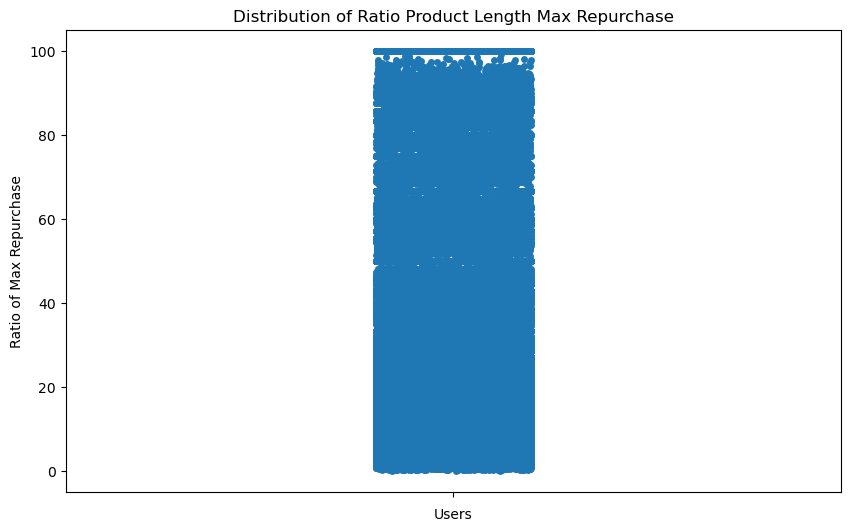

/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/anaconda3/envs/modeling/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x358f76d40> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
# Scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(gropuby_df.index, gropuby_df['ratio_product_length_max_repurchase'], alpha=0.6)
plt.title('Scatter Plot of Ratio Product Length Max Repurchase')
plt.xlabel('User Index')  # 실제 사용자 ID 대신 인덱스 사용
plt.ylabel('Ratio of Max Repurchase')
plt.grid(True)
plt.show()

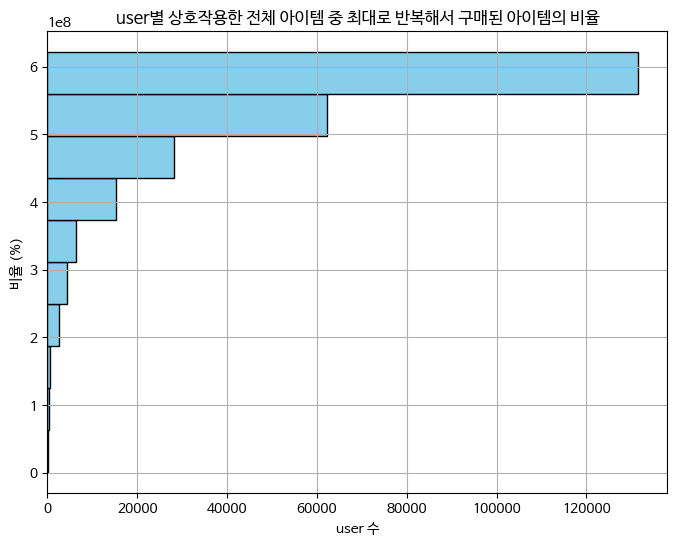

In [169]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_path = '/Users/yejin/Library/Fonts/NanumBarunGothic.ttf'

# 폰트 이름 얻기
font_name = fm.FontProperties(fname=font_path).get_name()

# 폰트 설정
plt.rc('font', family=font_name)
plt.figure(figsize=(8, 6))  # 그래프 크기 설정

# 데이터를 x와 y에 반대로 전달하여 히스토그램 그리기
plt.hist(gropuby_df['user_id'], bins=10, color='skyblue', edgecolor='black', orientation='horizontal')  # 히스토그램 생성

plt.xlabel('user 수')  # x축 레이블 설정
plt.ylabel('비율 (%)')  # y축 레이블 설정
plt.title('user별 상호작용한 전체 아이템 중 최대로 반복해서 구매된 아이템의 비율')  # 그래프 제목 설정
plt.grid(True)  # 격자 라인 추가
plt.show()  # 그래프 출력


In [17]:
gropuby_df['max_occurrence'].unique()

array([  2,   4,   6,  16,  10,   8,   7,   3,   1,  11,   5,  15,   9,
        13,  17,  14,  19,  12,  26,  52,  18,  20,  59,  23,  22, 118,
        25,  41,  68,  56,  44,  21,  34,  33,  30,  43,  53,  24,  75,
        29,  47,  54,  32,  39,  42,  36, 122,  28,  60,  55,  49,  40,
        57,  70,  27,  37,  51, 110,  45,  89,  50,  58, 140,  48,  66,
        35,  78,  80, 150,  46,  38,  73,  97, 111,  87,  86,  77, 165,
       142,  82,  65,  31,  94, 101,  72, 104,  74, 157,  90,  79,  62,
        63, 108, 180, 102,  61,  71,  69,  92, 169, 120,  99,  83, 133,
       152,  76, 121,  84, 113, 116,  95,  98,  67, 203, 117, 112, 106,
       184,  64, 124, 259, 177, 134, 282, 139, 175,  93, 149, 193,  91,
       114, 103,  81, 107,  96, 151, 321, 176, 155,  85, 202, 148, 164,
       130, 105, 137, 174, 163, 129, 168, 220, 314, 162, 138, 119, 173,
       145, 123])

In [116]:
gropuby_df[gropuby_df['max_occurrence']==101]

,user_id,product_id,duplicated_items,product_counts,max_occurrence,item_ratios,ratio_product_length_max_repurchase
16252,356000111,"[5809818, 5809818, 5814042, 5814040, 5809818, ...","[5809818, 5814042, 5814040, 5814043, 5849033, ...","{5809818: 101, 5814042: 2, 5814040: 6, 5814043...",101,"{5809818: 0.3377926421404682, 5814042: 0.00668...",33.779264
21322,381816972,"[5705002, 5705002, 5730402, 5700037, 5802432, ...","[5705002, 5730402, 5700037, 5802432, 6732, 562...","{5705002: 14, 5730402: 3, 5700037: 101, 580243...",101,"{5705002: 0.008860759493670886, 5730402: 0.001...",6.392405
371292,613245134,"[5700037, 5700046, 5700046, 5700046, 5700046, ...","[5700046, 5832214, 5868795, 5013, 5697533, 570...","{5700037: 1, 5700046: 19, 5919906: 1, 5752164:...",101,"{5700037: 0.00684931506849315, 5700046: 0.1301...",69.178082


In [129]:
# 리스트 요소들을 가로로 출력하기
index_value=74
column_name='product_id'

if index_value in gropuby_df.index:
    column_values = gropuby_df.loc[index_value, column_name]
    if isinstance(column_values, list):
        concatenated_values = ', '.join(map(str, column_values))
    else:
        concatenated_values = str(column_values)  # 단일 값일 경우 문자열로 변환
    print(concatenated_values)
else:
    print(f"Index '{index_value}' not found in DataFrame.")

5808664, 5808664, 5808664, 5808663, 5685402, 5808664, 5808664, 5808664


In [130]:
gropuby_df.loc[74,'product_counts']

{5808664: 6, 5808663: 1, 5685402: 1}

In [135]:
gropuby_df[gropuby_df['ratio_product_length_max_repurchase']>=40]

,user_id,product_id,duplicated_items,product_counts,max_occurrence,item_ratios,ratio_product_length_max_repurchase
9,12936739,"[5861791, 5861791, 5861791, 5861791, 5861791, ...","[5861791, 5894239]","{5861791: 6, 5894239: 3}",6,"{5861791: 0.6666666666666666, 5894239: 0.33333...",66.666667
28,27085410,"[5788440, 5788441, 5788435, 5776129, 5776129]",[5776129],"{5788440: 1, 5788441: 1, 5788435: 1, 5776129: 2}",2,"{5788440: 0.2, 5788441: 0.2, 5788435: 0.2, 577...",40.000000
39,30967218,"[5413, 5809912, 5885596, 5823937, 5885596, 588...","[5413, 5885596]","{5413: 7, 5809912: 1, 5885596: 4, 5823937: 1, ...",7,"{5413: 0.5, 5809912: 0.07142857142857142, 5885...",50.000000
52,32833906,"[5908784, 5913554, 5910468, 5910471, 5910471, ...","[5910468, 5910471]","{5908784: 1, 5913554: 1, 5910468: 2, 5910471: 3}",3,"{5908784: 0.14285714285714285, 5913554: 0.1428...",42.857143
53,33285892,"[5761297, 5859421, 5859402, 5859421, 5839651]",[5859421],"{5761297: 1, 5859421: 2, 5859402: 1, 5839651: 1}",2,"{5761297: 0.2, 5859421: 0.4, 5859402: 0.2, 583...",40.000000
...,...,...,...,...,...,...,...
394266,622072684,"[5882786, 5882786, 5882786, 5882786, 5882786]",[5882786],{5882786: 5},5,{5882786: 1.0},100.000000
394267,622073202,"[5687741, 5687741, 5687741, 5687741, 5687741]",[5687741],{5687741: 5},5,{5687741: 1.0},100.000000
394268,622073809,"[5812970, 5897926, 5854269, 5897926, 5812970]","[5812970, 5897926]","{5812970: 2, 5897926: 2, 5854269: 1}",2,"{5812970: 0.4, 5897926: 0.4, 5854269: 0.2}",40.000000
394270,622074345,"[5788438, 5846444, 5787964, 5846444, 5788438]","[5788438, 5846444]","{5788438: 2, 5846444: 2, 5787964: 1}",2,"{5788438: 0.4, 5846444: 0.4, 5787964: 0.2}",40.000000


In [136]:
103429/290854*100

35.56045301078892

In [101]:
gropuby_df[gropuby_df['user_id']==35276071]['product_id']

66    [5857673, 5857672, 5857673, 5857670, 5857673]
Name: product_id, dtype: object

In [98]:
gropuby_df[gropuby_df['user_id']==35276071]['product_id'].apply(lambda x:len(x))


66    5
Name: product_id, dtype: int64

In [99]:
# 특정 행의 product_counts 값 추출
target_row_index = 66 # 확인하고 싶은 특정 행의 인덱스
product_counts_dict = gropuby_df.loc[target_row_index, 'product_counts']

# product_counts_dict의 값들만 추출하여 Series 생성
values_series = pd.Series(list(product_counts_dict.values()))

# describe() 함수를 사용하여 요약 통계 확인
description = values_series.describe()

print(description)

count    3.000000
mean     1.666667
std      1.154701
min      1.000000
25%      1.000000
50%      1.000000
75%      2.000000
max      3.000000
dtype: float64


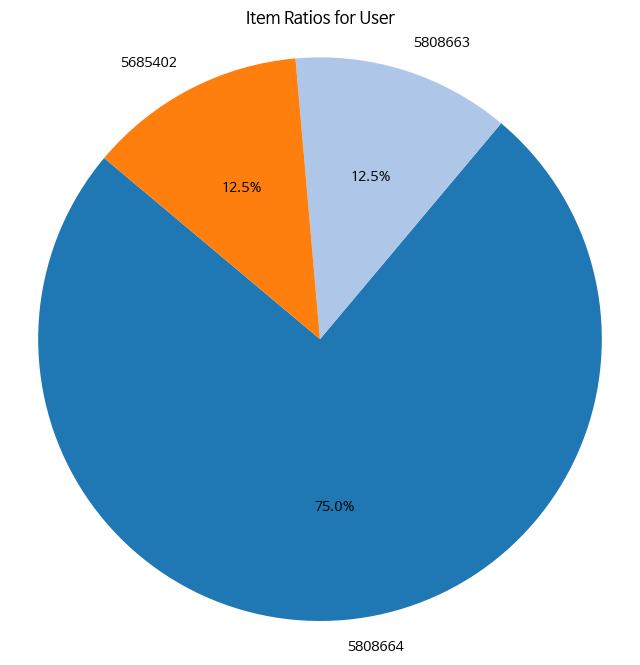

In [128]:
import matplotlib.pyplot as plt
# 아이템별 등장 횟수를 비율로 변환하는 함수
def calculate_item_ratio(product_counts_dict):
    total_items = sum(product_counts_dict.values())
    if total_items == 0:
        return {}
    return {item: count / total_items for item, count in product_counts_dict.items()}

# 특정 사용자의 아이템 등장 비율을 계산하여 DataFrame에 추가
gropuby_df['item_ratios'] = gropuby_df['product_counts'].apply(calculate_item_ratio)

# 도넛 차트로 시각화
plt.figure(figsize=(8, 8))

# 색상 설정을 위한 colormap
colors = plt.cm.tab20.colors  # 파이 차트에 사용할 색상 (20개의 색상)

# 도넛 차트 그리기
item_ratios = gropuby_df['item_ratios'].iloc[74]  # 특정 사용자의 아이템 비율
ratios = list(item_ratios.values())
labels = list(item_ratios.keys())

plt.pie(ratios, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title(f'Item Ratios for User')
plt.axis('equal')  # 원의 형태를 유지하여 원형으로 표시
plt.show()

In [6]:
from collections import Counter
# 각 행의 아이템 등장 횟수를 세는 함수 정의
def count_max_occurrence(row):
    counts = Counter(row)
    if counts:
        return max(counts.values())  # 가장 많이 등장한 아이템의 등장 횟수 반환
    else:
        return 0  # 빈 리스트인 경우 등장 횟수는 0

# 'items' 컬럼의 각 행에 대해 함수 적용하여 새로운 컬럼 생성
gropuby_df['max_occurrence'] = gropuby_df['product_id'].apply(count_max_occurrence)
gropuby_df

,user_id,product_id,duplicated_items,product_id_length,max_occurrence
0,0,"[5711145, 5814066, 5800358, 5800349, 5800349, ...","[5814066, 5800358, 5800349, 5712576, 5711087, ...",31,2
1,1,"[5746011, 5707747, 5746011, 5707747, 5841190, ...","[5746011, 5707747, 5896414, 5774240, 5875320, ...",24,4
2,2,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",[5784982],8,2
3,3,"[5809910, 5816169, 5809912, 5809910, 5809911, ...","[5809910, 5809912, 5809911, 4185]",27,6
4,4,"[5745712, 5745712, 49674, 49674, 5587748, 4590...","[5745712, 49674, 4590]",10,2
...,...,...,...,...,...
394278,394278,"[5822300, 5822297, 5549770, 5560966, 5567900, ...","[5561064, 5924482, 5917178]",30,3
394279,394279,"[5815662, 5815662, 5815662, 5773161, 5793704, ...","[5815662, 5793704, 5854883, 5585656, 5655060]",42,3
394280,394280,"[5883087, 5883087, 5883088, 5896787, 5896786, ...","[5883087, 5883088, 5896786]",13,4
394281,394281,"[5750301, 5662699, 5838938, 5885848, 5862943, ...","[5862943, 5862936, 5929030, 5826197, 5787015]",17,2


In [9]:
# product_id 컬럼의 길이(len)를 구하는 함수 정의
def calculate_length(products_list):
    return len(products_list)

# product_id 컬럼의 길이 계산하여 새로운 컬럼으로 추가
gropuby_df['product_id_length'] = gropuby_df['product_id'].apply(calculate_length)

# max_occurrence 값과 product_id 길이의 비율을 계산하여 새로운 컬럼으로 추가
gropuby_df['max_occurrence_ratio'] = gropuby_df['max_occurrence'] / gropuby_df['product_id_length']*100


In [10]:
gropuby_df

,user_id,product_id,duplicated_items,product_id_length,max_occurrence,max_occurrence_ratio
0,0,"[5711145, 5814066, 5800358, 5800349, 5800349, ...","[5814066, 5800358, 5800349, 5712576, 5711087, ...",31,2,6.451613
1,1,"[5746011, 5707747, 5746011, 5707747, 5841190, ...","[5746011, 5707747, 5896414, 5774240, 5875320, ...",24,4,16.666667
2,2,"[5815653, 5784982, 5795273, 5670334, 5735272, ...",[5784982],8,2,25.000000
3,3,"[5809910, 5816169, 5809912, 5809910, 5809911, ...","[5809910, 5809912, 5809911, 4185]",27,6,22.222222
4,4,"[5745712, 5745712, 49674, 49674, 5587748, 4590...","[5745712, 49674, 4590]",10,2,20.000000
...,...,...,...,...,...,...
394278,394278,"[5822300, 5822297, 5549770, 5560966, 5567900, ...","[5561064, 5924482, 5917178]",30,3,10.000000
394279,394279,"[5815662, 5815662, 5815662, 5773161, 5793704, ...","[5815662, 5793704, 5854883, 5585656, 5655060]",42,3,7.142857
394280,394280,"[5883087, 5883087, 5883088, 5896787, 5896786, ...","[5883087, 5883088, 5896786]",13,4,30.769231
394281,394281,"[5750301, 5662699, 5838938, 5885848, 5862943, ...","[5862943, 5862936, 5929030, 5826197, 5787015]",17,2,11.764706


In [11]:
gropuby_df['max_occurrence_ratio'].describe()

count    394283.000000
mean         28.906043
std          24.040298
min           0.146359
25%          11.320755
50%          20.454545
75%          40.000000
max         100.000000
Name: max_occurrence_ratio, dtype: float64

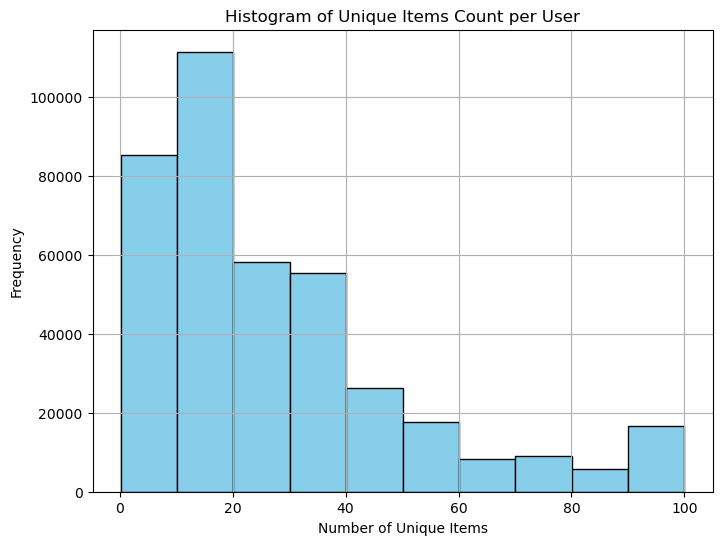

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))  # 그래프 크기 설정
plt.hist(gropuby_df['max_occurrence_ratio'], bins=10, color='skyblue', edgecolor='black')  # 히스토그램 생성
plt.xlabel('Number of Unique Items')  # x축 레이블 설정
plt.ylabel('Frequency')  # y축 레이블 설정
plt.title('Histogram of Unique Items Count per User')  # 그래프 제목 설정
plt.grid(True)  # 격자 라인 추가
plt.show()  # 그래프 출력


In [89]:
import matplotlib.pyplot as plt

# gropuby_df['unique_items_count'] = gropuby_df['product_id'].apply(count_unique_items)

# # 전체 상호작용 아이템 수 계산
# gropuby_df['total_interactions'] = gropuby_df['product_id'].apply(lambda x: len(x))

# 두 개의 값의 비율을 계산하여 동일한 비율을 가지도록 조정
# ratio = gropuby_df['total_interactions'] / gropuby_df['unique_items_count']

# # 그래프 그리기
# fig, ax1 = plt.subplots(figsize=(8, 6))  # 그래프 크기 설정

# # 고유한 상품 수에 대한 선 그래프 그리기 (첫 번째 y 축)
# ax1.plot(gropuby_df.index, gropuby_df['unique_items_count'], marker='o', linestyle='-', color='blue', label='Unique Items Count')
# ax1.set_xlabel('User Index')  # x축 레이블 설정
# ax1.set_ylabel('Unique Items Count', color='skyblue')  # 첫 번째 y 축 레이블 설정
# ax1.tick_params(axis='y', labelcolor='skyblue')  # 첫 번째 y 축 눈금 색상 설정

# # 전체 상호작용 아이템 수에 대한 선 그래프 그리기 (두 번째 y 축)
# ax2 = ax1.twinx()  # 두 번째 y 축 생성
# ax2.plot(gropuby_df.index, gropuby_df['total_interactions'] / ratio, marker='s', linestyle='--', color='orange',alpha=0.5, label='Total Interactions (Adjusted)')
# ax2.set_ylabel('Total Interactions (Adjusted)', color='orange')  # 두 번째 y 축 레이블 설정
# ax2.tick_params(axis='y', labelcolor='orange')  # 두 번째 y 축 눈금 색상 설정

# # 그래프 제목 설정
# plt.title('Comparison of Unique Items Count and Total Interactions per User')

# # 범례 표시
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

# 각 사용자의 고유한 상품 수 계산
gropuby_df['unique_items_count'] = gropuby_df['product_id'].apply(lambda x: len(set(x)))

# 전체 상호작용 아이템 수 계산
gropuby_df['total_interactions'] = gropuby_df['product_id'].apply(lambda x: len(x))
plt.grid(True)  # 격자 라인 추가

# 그래프 그리기 (막대 그래프)
plt.figure(figsize=(10, 6))
width = 0.35
ind = gropuby_df.index

# 고유한 상품 수 막대 그래프
plt.bar(ind, gropuby_df['unique_items_count'], width, label='Unique Items Count', color='skyblue')

# 전체 상호작용 아이템 수 막대 그래프
plt.bar(ind + width, gropuby_df['total_interactions'], width, label='Total Interactions', color='orange')

# 그래프 제목 및 축 레이블 설정
plt.xlabel('User Index')
plt.ylabel('Count')
plt.title('Comparison of Unique Items Count and Total Interactions per User')
plt.xticks(ind + width / 2, gropuby_df['user'])  # x 축 눈금 레이블 설정
plt.legend()  # 범례 표시

plt.grid(True)  # 격자 라인 추가
plt.show()  # 그래프 출력


KeyboardInterrupt: 

In [39]:
gropuby_df['max_occurrence'].unique()  # 한 user가 같은 아이템을 구매한 최대 횟수

array([  2,   4,   6,  16,  10,   8,   7,   3,   1,  11,   5,  15,   9,
        13,  17,  14,  19,  12,  26,  52,  18,  20,  59,  23,  22, 118,
        25,  41,  68,  56,  44,  21,  34,  33,  30,  43,  53,  24,  75,
        29,  47,  54,  32,  39,  42,  36, 122,  28,  60,  55,  49,  40,
        57,  70,  27,  37,  51, 110,  45,  89,  50,  58, 140,  48,  66,
        35,  78,  80, 150,  46,  38,  73,  97, 111,  87,  86,  77, 165,
       142,  82,  65,  31,  94, 101,  72, 104,  74, 157,  90,  79,  62,
        63, 108, 180, 102,  61,  71,  69,  92, 169, 120,  99,  83, 133,
       152,  76, 121,  84, 113, 116,  95,  98,  67, 203, 117, 112, 106,
       184,  64, 124, 259, 177, 134, 282, 139, 175,  93, 149, 193,  91,
       114, 103,  81, 107,  96, 151, 321, 176, 155,  85, 202, 148, 164,
       130, 105, 137, 174, 163, 129, 168, 220, 314, 162, 138, 119, 173,
       145, 123])

In [60]:
gropuby_df[gropuby_df['max_occurrence']==321]['product_id'].apply(lambda x:len(x))

132661    321
Name: product_id, dtype: int64

In [61]:
series_data=gropuby_df[gropuby_df['max_occurrence']==321]['product_id']
series_data

132661    [5872979, 5872979, 5872979, 5872979, 5872979, ...
Name: product_id, dtype: object

In [57]:
def get_last_element(series):
    return series.apply(lambda x: x[-1])

# Applying the function to the series_data
last_elements = get_last_element(series_data)
last_elements

380158    5686083
Name: product_id, dtype: int64

In [90]:
359563/394398*100 # 재구매 user비율 

91.16755155959208

In [97]:
# 중복을 제거할 집합(set) 생성
unique_items = set()

# 데이터프레임의 duplicated_items 컬럼을 순회하면서 중복 없이 원소 추가
for row in gropuby_df['duplicated_items']:
    unique_items.update(row)

# 중복 없이 추가된 원소들을 리스트로 변환
unique_items_list = list(unique_items)
len(unique_items_list)

46779

In [98]:
unique_items_list

[5898240,
 5898241,
 5898242,
 5898243,
 5898244,
 5898245,
 5898246,
 5898247,
 5898252,
 5898253,
 5898254,
 5898255,
 5898256,
 5898257,
 5898258,
 5898259,
 5898260,
 5898261,
 5898262,
 5898263,
 5898264,
 5898265,
 5898266,
 5898267,
 5898268,
 5898269,
 5898270,
 5898271,
 5898272,
 5887669,
 5898361,
 5898362,
 5898363,
 5898364,
 5898365,
 5898366,
 5898367,
 5898368,
 5898369,
 5898370,
 5898371,
 5898372,
 5898373,
 5898374,
 5898375,
 5898376,
 5898377,
 5898378,
 5898379,
 5898380,
 5898381,
 5898382,
 5898383,
 5898384,
 5898385,
 5898386,
 5898387,
 5898388,
 5898399,
 5636289,
 5636290,
 5767364,
 5767365,
 5767366,
 5767367,
 5767368,
 5767369,
 5767370,
 5767371,
 5767373,
 5767374,
 5767375,
 5767376,
 5767377,
 5767378,
 5767379,
 5898469,
 5898470,
 5898476,
 5898477,
 5636336,
 5636337,
 5636338,
 5636339,
 5636340,
 5636341,
 5636342,
 5898496,
 5898497,
 5898498,
 5636361,
 5767492,
 5767493,
 5767494,
 5767495,
 5767496,
 5767497,
 5767498,
 5767499,
 5767500,


In [92]:
46779/48442

0.9656702861153544

In [66]:
# item, category matching
result_dict_c= df.set_index('product_id')['category_id'].to_dict()
items_map['item2category'] ={key: '' if pd.isna(value) else value for key, value in result_dict_c.items()}

# item, brand matching
result_dict_b= df.set_index('product_id')['brand'].to_dict()
items_map['item2brand'] ={key: '' if pd.isna(value) else value for key, value in result_dict_b.items()}


user_reviews = defaultdict(list)

for index, row in df.iterrows():
    user_reviews[row['user_id']].append([row['product_id'],row['timestamp']])
item2category_id = defaultdict(list)
categories_n_max=0

for k in items_map['item2category'].keys():
    category= items_map['item2category'][k] # k:item, category:item's category
    if category2id[category] not in item2category_id[k]:
        item2category_id[k].append(category2id[category])
    categories_n_max = len(item2category_id[k]) if len(
        item2category_id[k]) > categories_n_max else categories_n_max
        
for k in items_map['item2category'].keys():
    if items_map['item2category'][k] in category2id:
        item2category_id[k] = category2id[items_map['item2category'][k]]
    else:
        category2id[items_map['item2category'][k]] = len(category2id)
        item2category_id[k] = category2id[items_map['item2category'][k]]
        
item2brand_id = {}
for k in items_map['item2brand'].keys():
    if items_map['item2brand'][k] in brand2id:
        item2brand_id[k] = brand2id[items_map['item2brand'][k]]
    else:
        brand2id[items_map['item2brand'][k]] = len(brand2id)
        item2brand_id[k] = brand2id[items_map['item2brand'][k]]


In [71]:
item_features = {0: [0] * 2} ##
for k in items_map['item2brand'].keys():
    # category_feature = item2category_id[k] + (categories_n_max - len(item2category_id[k])) * [0]
    item_feature = [item2category_id[k]] +[item2brand_id[k]]
    assert len(item_feature) == len(item_features[0])
    item_features[item2id[k]] = item_feature


In [72]:
item_features

{0: [0, 0],
 1: [1, 1],
 2: [2, 262],
 3: [1, 3],
 4: [3, 4],
 5: [4, 262],
 6: [5, 262],
 7: [6, 5],
 8: [7, 6],
 9: [8, 7],
 10: [1, 262],
 11: [9, 8],
 12: [10, 262],
 13: [11, 9],
 14: [12, 262],
 15: [11, 9],
 16: [13, 10],
 17: [14, 262],
 18: [15, 262],
 19: [16, 1],
 20: [8, 7],
 21: [9, 8],
 22: [12, 11],
 23: [5, 262],
 24: [8, 7],
 25: [17, 262],
 26: [17, 262],
 27: [18, 5],
 28: [17, 262],
 29: [17, 262],
 30: [5, 262],
 31: [18, 9],
 32: [17, 262],
 33: [15, 262],
 34: [15, 262],
 35: [3, 12],
 36: [17, 262],
 37: [445, 13],
 38: [5, 11],
 39: [20, 14],
 40: [18, 5],
 41: [15, 262],
 42: [9, 15],
 43: [5, 262],
 44: [3, 16],
 45: [18, 11],
 46: [21, 7],
 47: [21, 17],
 48: [22, 262],
 49: [5, 262],
 50: [23, 5],
 51: [5, 262],
 52: [21, 17],
 53: [21, 17],
 54: [455, 9],
 55: [439, 11],
 56: [5, 262],
 57: [23, 262],
 58: [12, 262],
 59: [18, 18],
 60: [12, 262],
 61: [466, 262],
 62: [18, 18],
 63: [27, 11],
 64: [28, 262],
 65: [29, 262],
 66: [30, 262],
 67: [31, 262],

In [ ]:

min_year = pd.to_datetime(np.array(df['timestamp']).min(), unit='s').year
max_year = pd.to_datetime(np.array(df['timestamp']).max(), unit='s').year

User = defaultdict(list)
for u in user_reviews.keys():
    for item, action_time in user_reviews[u]:
        act_datetime = pd.to_datetime(action_time, unit='s')
        year = (act_datetime.year - min_year) / (max_year - min_year)
        month = act_datetime.month / 12
        day = act_datetime.day / 31
        dayofweek = act_datetime.dayofweek / 7
        dayofyear = act_datetime.dayofyear / 365
        week = act_datetime.week / 4
        context = [year, month, day, dayofweek, dayofyear, week]
        User[user2id[u]].append([item2id[item], context])

item_period = calculate_purchase_intervals(User)

data = {
    'user_seq': user_reviews,
    'items_map': items_map,
    'user_seq_token': User,
    'items_feat': item_features,
    'user2id': user2id,
    'item2id': item2id,
    'category2id': category2id,
    'brand2id': brand2id,
    'max_categories_n': categories_n_max,
    'item_period': item_period
}
import IPython; IPython.embed(colors="Linux"); exit(1)

pkl.dump(data, open(f'{dataset_name}/{dataset_name}.dat', 'wb'))
print(f'generate_data:{dataset_name}.dat has finished!')

write_seq(User,'e_commerce_cosmetic')  # write seq txt file 


if __name__ == '__main__':
for dataset_name in ['e_commerce_cosmetic']:
    generate_data(dataset_name, 'data/e_commerce_cosmetic/e_commerce_cosmetic.csv')


In [28]:
def factorize_itemid(itemid_list):
    # 딕셔너리 초기화 (PAD 값을 0으로 설정)
    id_to_factorized = {'PAD': 0}
    next_id = 1  # 다음 factorized id는 1부터 시작

    for itemid in itemid_list:
        if itemid not in id_to_factorized:
            # 새로운 itemid를 factorized id로 매핑
            id_to_factorized[itemid] = next_id
            next_id += 1  # 다음 factorized id 증가

    return id_to_factorized

category2id=factorize_itemid(df['category_id'])

In [2]:
product_id_counts = df['product_id'].value_counts()

# 출현 횟수가 5번 미만인 business_id 찾기
rare_product_ids = product_id_counts[product_id_counts < 5].index.tolist()
df=df[~df['product_id'].isin(rare_product_ids)]
df

,user_id,product_id,event_time,category_id,brand,price
0,595412617,5798924,2020-01-01 00:00:19 UTC,1783999068867920626,zinger,3.97
1,420652863,5793052,2020-01-01 00:00:24 UTC,1487580005754995573,NaN,4.92
2,595412617,5837111,2020-01-01 00:00:30 UTC,1783999068867920626,staleks,6.35
3,593016733,5850281,2020-01-01 00:00:37 UTC,1487580006300255120,marathon,137.78
4,595411904,5802440,2020-01-01 00:00:46 UTC,2151191070908613477,NaN,2.16
...,...,...,...,...,...,...
17494160,429913900,5848062,2019-10-31 23:59:13 UTC,1526733091857498510,NaN,9.21
17494161,433392631,5769981,2019-10-31 23:59:14 UTC,1487580005411062629,cnd,16.03
17494162,429913900,5848062,2019-10-31 23:59:25 UTC,1526733091857498510,NaN,9.21
17494163,556138645,5885631,2019-10-31 23:59:30 UTC,1783999064103190764,NaN,15.48


In [3]:
user_id_counts = df['user_id'].value_counts()

# 출현 횟수가 5번 미만인 business_id 찾기
rare_user_ids = user_id_counts[user_id_counts < 5].index.tolist()
df=df[~df['user_id'].isin(rare_user_ids)]
df

,user_id,product_id,event_time,category_id,brand,price
0,595412617,5798924,2020-01-01 00:00:19 UTC,1783999068867920626,zinger,3.97
1,420652863,5793052,2020-01-01 00:00:24 UTC,1487580005754995573,NaN,4.92
2,595412617,5837111,2020-01-01 00:00:30 UTC,1783999068867920626,staleks,6.35
3,593016733,5850281,2020-01-01 00:00:37 UTC,1487580006300255120,marathon,137.78
4,595411904,5802440,2020-01-01 00:00:46 UTC,2151191070908613477,NaN,2.16
...,...,...,...,...,...,...
17494160,429913900,5848062,2019-10-31 23:59:13 UTC,1526733091857498510,NaN,9.21
17494161,433392631,5769981,2019-10-31 23:59:14 UTC,1487580005411062629,cnd,16.03
17494162,429913900,5848062,2019-10-31 23:59:25 UTC,1526733091857498510,NaN,9.21
17494163,556138645,5885631,2019-10-31 23:59:30 UTC,1783999064103190764,NaN,15.48


In [83]:
df = df.drop_duplicates(subset=['user_id', 'product_id', 'event_time'])
df

,user_id,product_id,brand,category_id,event_time,timestamp
1,420652863,5793052,NaN,1487580005754995573,2020-01-01 00:00:24 UTC,1577836824
5,420652863,5726464,NaN,1487580005268456287,2020-01-01 00:00:57 UTC,1577836857
7,588166646,5809910,grattol,1602943681873052386,2020-01-01 00:01:05 UTC,1577836865
12,502631750,5784983,severina,2195085255034011676,2020-01-01 00:01:40 UTC,1577836900
14,420652863,5741352,irisk,1487580005427839846,2020-01-01 00:01:48 UTC,1577836908
...,...,...,...,...,...,...
17494159,429913900,5747404,masura,1487580005671109489,2019-10-31 23:59:08 UTC,1572566348
17494160,429913900,5848062,NaN,1526733091857498510,2019-10-31 23:59:13 UTC,1572566353
17494162,429913900,5848062,NaN,1526733091857498510,2019-10-31 23:59:25 UTC,1572566365
17494163,556138645,5885631,NaN,1783999064103190764,2019-10-31 23:59:30 UTC,1572566370


In [93]:
import pandas as pd

# event_time 컬럼을 pd.Timestamp 객체로 변환하여 UNIX 시간으로 변환
df['event_time'] = pd.to_datetime(df['event_time'], utc=True)  # UTC 시간으로 인식
df['unix_timestamp'] = df['event_time'].apply(lambda x: int(x.timestamp()))  # 초 단위로 변환

print(df)


/var/folders/wj/tbypyq6j5pn9209l5xv_vrz40000gn/T/ipykernel_24260/3922252845.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['event_time'] = pd.to_datetime(df['event_time'], utc=True)  # UTC 시간으로 인식


            user_id  product_id                event_time  \
2         595412617     5798924 2020-01-01 00:00:19+00:00   
3         420652863     5793052 2020-01-01 00:00:24+00:00   
5         595412617     5837111 2020-01-01 00:00:30+00:00   
6         593016733     5850281 2020-01-01 00:00:37+00:00   
7         595411904     5802440 2020-01-01 00:00:46+00:00   
...             ...         ...                       ...   
20692833  429913900     5848062 2019-10-31 23:59:13+00:00   
20692834  433392631     5769981 2019-10-31 23:59:14+00:00   
20692835  429913900     5848062 2019-10-31 23:59:25+00:00   
20692836  556138645     5885631 2019-10-31 23:59:30+00:00   
20692838  429913900     5870838 2019-10-31 23:59:36+00:00   

                  category_id     brand   price  unix_timestamp  
2         1783999068867920626    zinger    3.97      1577836819  
3         1487580005754995573       NaN    4.92      1577836824  
5         1783999068867920626   staleks    6.35      1577836830  
6  

/var/folders/wj/tbypyq6j5pn9209l5xv_vrz40000gn/T/ipykernel_24260/3922252845.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unix_timestamp'] = df['event_time'].apply(lambda x: int(x.timestamp()))  # 초 단위로 변환


In [5]:
# df['user_id'],_ = pd.factorize(df['user_id'])
# df['product_id'],_ = pd.factorize(df['product_id'])  

gropuby_df= df.groupby('user_id')['product_id'].apply(list).reset_index()
gropuby_df


,user_id,product_id
0,1458813,"[5711145, 5814066, 5800358, 5800349, 5800349, ..."
1,2963072,"[5746011, 5707747, 5746011, 5707747, 5841190, ..."
2,4103071,"[5815653, 5784982, 5795273, 5670334, 5735272, ..."
3,4661182,"[5809910, 5816169, 5809912, 5809910, 5809911, ..."
4,5493470,"[5745712, 5745712, 49674, 49674, 5587748, 4590..."
...,...,...
394278,622082232,"[5822300, 5822297, 5549770, 5560966, 5567900, ..."
394279,622082947,"[5815662, 5815662, 5815662, 5773161, 5793704, ..."
394280,622083330,"[5883087, 5883087, 5883088, 5896787, 5896786, ..."
394281,622084975,"[5750301, 5662699, 5838938, 5885848, 5862943, ..."


In [6]:
# 컬럼의 리스트 값을 모두 하나의 리스트로 펼치기
all_items = [item for sublist in gropuby_df['product_id'] for item in sublist]

# 펼친 리스트의 고유값(unique values)들의 집합(set) 생성
unique_items = set(all_items)

# 고유값들의 개수 출력
num_unique_items = len(unique_items)
num_unique_items

# set을 리스트로 변환
values_list = list(unique_items)

# 데이터프레임 생성
df = pd.DataFrame(values_list, columns=['Values'])

# describe() 메서드를 사용하여 통계 정보 계산
description = df.describe()
description

,Values
count,4.737900e+04
mean,5.618857e+06
std,1.071661e+06
min,3.752000e+03
25%,5.773362e+06
50%,5.838197e+06
75%,5.879130e+06
max,5.932595e+06


In [7]:
num_unique_items

47379

In [10]:
from collections import defaultdict

user_reviews = defaultdict(list)

for index, row in df.iterrows():
    user_reviews[str(row['user_id'])].append([row['product_id'],row['event_time']])


user_reviews

defaultdict(list,
            {'595412617': [[5798924, '2020-01-01 00:00:19 UTC'],
              [5837111, '2020-01-01 00:00:30 UTC'],
              [5831649, '2020-01-01 00:01:33 UTC'],
              [44151, '2019-12-31 23:45:42 UTC'],
              [5861278, '2019-12-31 23:46:46 UTC'],
              [5700037, '2019-12-31 23:47:02 UTC'],
              [5837111, '2019-12-31 23:55:15 UTC'],
              [5798924, '2019-12-31 23:56:02 UTC'],
              [5809910, '2019-12-31 23:57:28 UTC']],
             '420652863': [[5793052, '2020-01-01 00:00:24 UTC'],
              [5726464, '2020-01-01 00:00:57 UTC'],
              [5741352, '2020-01-01 00:01:48 UTC'],
              [5741345, '2020-01-01 00:02:09 UTC'],
              [5755166, '2020-01-01 00:04:14 UTC'],
              [5726464, '2020-01-01 00:04:50 UTC'],
              [5699801, '2020-01-01 00:05:38 UTC'],
              [5858887, '2020-01-01 00:06:45 UTC'],
              [5847343, '2020-01-01 00:07:11 UTC'],
              [573021

In [10]:
# 중복된 항목을 추출하여 새로운 컬럼에 저장하는 함수 정의
def extract_duplicates(items):
    duplicate_items = []
    for item in items:
        if items.count(item) > 1 and item not in duplicate_items:
            duplicate_items.append(item)
    return duplicate_items

# 새로운 컬럼에 중복된 항목 저장
gropuby_df['duplicated_items'] = gropuby_df['product_id'].apply(extract_duplicates)

print(gropuby_df)

          user_id                                         product_id  \
0         1458813  [5711145, 5814066, 5800358, 5800349, 5800349, ...   
1         2963072  [5746011, 5707747, 5746011, 5707747, 5841190, ...   
2         4103071  [5815653, 5784982, 5795273, 5670334, 5735272, ...   
3         4661182  [5809910, 5816169, 5809912, 5809910, 5809911, ...   
4         5493470  [5745712, 5745712, 49674, 49674, 5587748, 4590...   
...           ...                                                ...   
394278  622082232  [5822300, 5822297, 5549770, 5560966, 5567900, ...   
394279  622082947  [5815662, 5815662, 5815662, 5773161, 5793704, ...   
394280  622083330  [5883087, 5883087, 5883088, 5896787, 5896786, ...   
394281  622084975  [5750301, 5662699, 5838938, 5885848, 5862943, ...   
394282  622086433      [5866471, 5769368, 5922857, 5844342, 5661522]   

                                         duplicated_items  
0       [5814066, 5800358, 5800349, 5712576, 5711087, ...  
1       [574601

In [32]:
unix_timestamp_list = []
d_e=pd.to_datetime(df['event_time'], utc=True)

for utc_time_str in d_e:
    # UTC 타임 형식의 문자열을 datetime 형식으로 변환
    datetime_utc = pd.to_datetime(utc_time_str)
    
    # datetime_utc 객체를 tz-naive 객체로 변환하여 Unix 타임스탬프(초 단위) 계산
    datetime_naive = datetime_utc.tz_localize(None)  # 시간대 정보 제거 (tz-naive 객체로 변환)
    unix_timestamp = (datetime_naive - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')
    
    unix_timestamp_list.append(unix_timestamp)
    print(unix_timestamp_list)



In [15]:
gropuby_df['duplicated_items'].apply(lambda x:len(x)).max()

1804

In [140]:
from collections import Counter

counter=Counter(df['product_id'].tolist())
counter

Counter({5809910: 104836,
         5809912: 48468,
         5700037: 43821,
         5854897: 39936,
         5802432: 39277,
         5815662: 36818,
         5751422: 36107,
         5751383: 34626,
         5809911: 32067,
         5849033: 31568,
         5816170: 28642,
         5792800: 27440,
         5686925: 24823,
         5304: 21655,
         5877454: 21186,
         5528035: 20418,
         5700046: 19628,
         5814046: 17916,
         5836522: 17290,
         5856186: 17266,
         5789668: 16605,
         5833334: 16392,
         5886282: 16059,
         5843836: 15872,
         5816166: 15843,
         5773361: 15740,
         5013: 15410,
         5700035: 14993,
         5816172: 14581,
         5833330: 14538,
         5892179: 14182,
         5877456: 13986,
         5900651: 13909,
         5790563: 13570,
         5850281: 13492,
         5687151: 13386,
         5761411: 13266,
         5776130: 13237,
         5560754: 13092,
         5649219: 12854,
     

In [148]:
# Counter 객체에서 값(value)이 1 이상인 키(key)들을 추출
filtered_keys = [key for key, value in counter.items() if value > 1]

# 값이 1 이상인 키들에 해당하는 값(value)들을 데이터프레임의 열(column)로 변환
values_list = [counter[key] for key in filtered_keys]
df = pd.DataFrame(values_list, columns=['count'])

# 데이터프레임의 describe() 메서드를 사용하여 통계 정보 출력
description = df.describe()
description

,count
count,47379.000000
mean,369.031491
std,1134.867565
min,2.000000
25%,42.000000
50%,120.000000
75%,323.000000
max,104836.000000


In [145]:
counter.values()==1

False

### 5-core

- 5번 이하 나타난 가게 삭제

In [ ]:
business_id_counts = df['business_id'].value_counts()

# 출현 횟수가 5번 미만인 business_id 찾기
rare_business_ids = business_id_counts[business_id_counts < 5].index.tolist()
rare_business_ids

[]

- 5번 이하 review 남긴 user 삭제

In [ ]:
user_id_counts = df['user_id'].value_counts()

rare_user_ids = user_id_counts[user_id_counts < 5].index.tolist()
df=df[~df['user_id'].isin(rare_user_ids)]
df

,user_id,business_id,date
0,0,0,2018-07-07 22:09:11
1,1,1,2012-01-03 15:28:18
2,2,2,2014-02-05 20:30:30
3,3,3,2015-01-04 00:01:03
4,4,4,2017-01-14 20:54:15
...,...,...,...
6990275,308285,142809,2014-12-17 21:45:20
6990276,1295046,138384,2021-03-31 16:55:10
6990277,18109,142627,2019-12-30 03:56:30
6990278,227995,148228,2022-01-19 18:59:27


In [73]:
if 5742717 in list(df['product_id'].value_counts().keys()):
    print(df[df['product_id']==5742717].value_counts().values)

TypeError: 'numpy.ndarray' object is not callable

In [65]:
for item in item_list:
    if item in list(df['product_id'].value_counts().keys()):
        print(df['product_id'].value_counts().value())

In [44]:
df['count'].unique()

array([0])

In [23]:
100-35120/396044*100

91.13229843148741

In [24]:
396044-35120

360924

In [94]:
import pandas as pd


# user_id를 key로 하고, 같은 행에 있는 product_id와 timestamp를 리스트로 묶어서 딕셔너리 생성
user_dict = {}
for index, row in df.iterrows():
    user_id = row['user_id']
    product_id = row['product_id']
    timestamp = row['event_time']
    
    if user_id not in user_dict:
        user_dict[user_id] = []
    
    user_dict[user_id].append([product_id, timestamp])

print(user_dict)


In [46]:
n=int(input())
for i in range(0,n+1):
    for j in range(0,n-i+1):
        print(' ',end='')
    for j in range(0,2*(i+1)-1):
        print('*',end='')
    
    print('\n')

for i in range(1,n+1):
    for j in range(0,i+1):
        print(' ',end='')
    for j in range(2*(n-i)+1,0,-1):
        print('*',end='')
    
    print('\n')

      *

     ***

    *****

   *******

  *********

 ***********

  *********

   *******

    *****

     ***

      *

